In [2]:
import alto

In [3]:
import os
import xml.etree.ElementTree as ET
import xml.etree as etree
from PIL import Image, ImageDraw, ImageFont
import numpy as np
import re


DEFAULT_FONT = ImageFont.truetype("./FreeMono.ttf", 40)

ALTO_TAG_TYPES_REGEX = re.compile('<LayoutTag ID="(.+)" LABEL="(.+)"/>')

class AltoReader:        
    def __init__(self, page_xml_path):
        self.page_xml_path = page_xml_path
        self.page_image = None

        # Calculate downsample factor from page dimensions vs. image dimensions
        img = self.get_page_image()
        self.alto_root = parse_file(self.page_xml_path)
        page_height = self.alto_root.layout.pages[0].height
        page_width = self.alto_root.layout.pages[0].width
        image_width, image_height = img.size
        self.downsample_factor = page_height / image_height
        

        self.tag_types = self.get_tag_types()

    def get_tag_types(self):
        """
        Parse the tags section of the ALTO file to extract the labels for each tag type (headline, text block etc.).

        For example, if the file contains:
        `<Tags>
    		<LayoutTag ID="LAYOUT_TAG_000" LABEL="Textblock"/>
    		<LayoutTag ID="LAYOUT_TAG_001" LABEL="Headline"/>
    		<LayoutTag ID="LAYOUT_TAG_002" LABEL="Illustration"/>
    		<LayoutTag ID="LAYOUT_TAG_003" LABEL="Caption"/>
    		<LayoutTag ID="LAYOUT_TAG_004" LABEL="Advertisement"/>
    		<LayoutTag ID="LAYOUT_TAG_005" LABEL="ContinuationHeadline"/>
    		<LayoutTag ID="LAYOUT_TAG_006" LABEL="ContinuationLink"/>
    		<LayoutTag ID="LAYOUT_TAG_007" LABEL="PageNumber"/>
    		<LayoutTag ID="LAYOUT_TAG_008" LABEL="RunningTitle"/>
    	</Tags>`

        This will return {"LAYOUT_TAG_000": "Textblock", "LAYOUT_TAG_001": "Headline", ...}
        """
        with open(self.page_xml_path, "r", encoding="utf-8") as xml_file:
            xml_text = xml_file.read()
            tag_types = ALTO_TAG_TYPES_REGEX.findall(xml_text)
        return {tt[0]: tt[1] for tt in tag_types}
    def get_page_number(self):
        return int(os.path.basename(self.page_xml_path.replace(".xml", "")))
    def get_text_blocks(self):
        """
        Get all text blocks in page XML file (e.g. Pg001.xml)
        """
        all_blocks = self.alto_root.extract_text_blocks()
        blocks = [self.extract_block_data(b) for b in all_blocks]
        self.group_blocks(blocks)
        return blocks

    def get_page_image(self):
        if self.page_image is None:
            page_number = self.get_page_number()
            image = Image.open(os.path.join(os.path.dirname(os.path.dirname(self.page_xml_path)), f'MASTER/{page_number:04d}.jp2'))
            # Convert image from 0-128 range to 0-255 range. Otherwise the conversion to RGB doesn't work
            arr = np.array(image)
            arr[arr==0]=1
            image = Image.fromarray((arr-1)+arr).convert("RGB")
            self.page_image = image
        return self.page_image
    
    def get_image_for_block(self, block, padding=0):
        image = self.get_page_image(resolution)
        res_downsample = self.downsample_factor
        crop_coordinates = [int(c / res_downsample) for c in block['position']]
        return image.crop([crop_coordinates[0] - padding, crop_coordinates[1] - padding, crop_coordinates[2] + padding, crop_coordinates[3] + padding])
    
    def extract_block_data(self, block):
        return {
            # "parent_id": parent,
            "position": (block.hpos, block.vpos,  block.hpos+block.width, block.vpos+block.height,),
            "block_id": block.id,
            "tagrefs": block.tagrefs,
            "type": self.tag_types.get(block.tagrefs, "Unknown"),
            "text": "\n".join([" ".join(t.extract_words()) for t in block.text_lines]),
        }

    def group_blocks(self, blocks):
        current_group = 0
        for b in blocks:
            if b["type"] == "Headline" or b["type"] == "ContinuationHeadline":
                current_group += 1
            b["group"] = current_group

    def get_debug_image(self):
        blocks = reader.get_text_blocks()
        image = reader.get_page_image().copy()
        draw = ImageDraw.Draw(image)
        res_downsample = reader.downsample_factor
        for i, block in enumerate(blocks):
            draw.text((int(block["position"][0] / res_downsample), int(block["position"][1] / res_downsample)-40), f"{i} {block['group']} {block['type']}", (255,100,100), font=DEFAULT_FONT)
            draw.rectangle([int(c / res_downsample) for c in block["position"]], outline=(255, 0, 0), width=3)
        return image


In [6]:
from importlib import reload
import alto
from alto import parse_file
reload(alto)

xml_file = "../04_01/ALTO/0007.xml"
reader = AltoReader(xml_file)

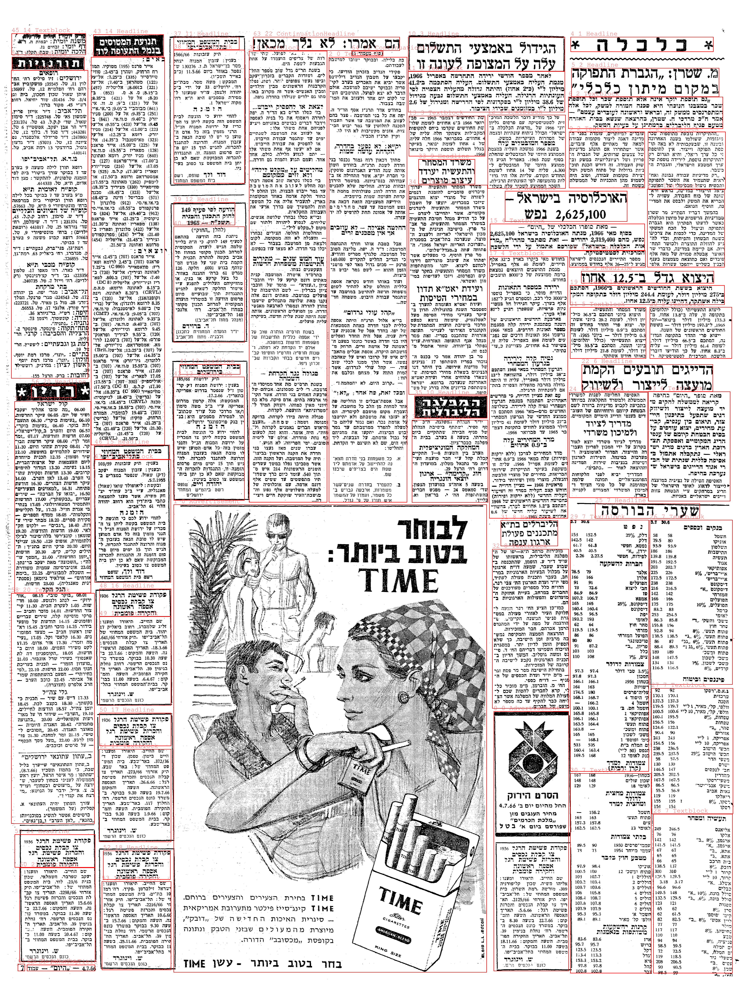

In [7]:
reader.get_debug_image()